### Setting up the google colab (optional)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
!pip install numpy
!pip install pandas
!pip install scanpy
!pip install scanpy.external
!pip install harmonypy
!pip install seaborn
!pip install mudata
!pip install muon
!pip install mudatasets

## Importing the necessary packages

In [ ]:
import numpy as np
import pandas as pd
import scanpy as sc
import mudata as md
import muon as mu
import mudatasets as mds
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy.external as sce
from scipy import stats
from Bio import SeqIO
from matplotlib.pyplot import rc_context

In [ ]:
sc.settings.verbosity = 4
sc.logging.print_header()
sc.settings.set_figure_params(dpi=300, facecolor='white', format = 'pdf', vector_friendly = True)

scanpy==1.9.1 anndata==0.8.0 umap==0.5.2 numpy==1.22.4 scipy==1.10.1 pandas==1.4.3 scikit-learn==1.0.2 statsmodels==0.13.2 python-igraph==0.10.4 louvain==0.7.1 pynndescent==0.5.6


In [ ]:
umap_cmap = sns.blend_palette(['lightgrey', 'xkcd:sapphire'], as_cmap = True)

## Read processed and unprocessed data as taken from previous notebooks

In [ ]:
#Unprocessed
mdata = mu.read('$PATH/hydractinia/matrices_and_seurat/20230703_genome_2.1_no_multimappers/20230704_hydractinia_atlas_labelled_with_and_no_multimappers_ratio.h5mu')
adata_u=(mdata.mod['no'])

/mnt/sda/david/.local/lib/python3.8/site-packages/mudata/_core/mudata.py:457: UserWarning: Cannot join columns with the same name because var_names are intersecting.
  warnings.warn(


In [ ]:
#Processed
mdata = mu.read("$PATH/hydractinia/hydractinia_atlas_colored_20230825.h5mu")
adata_p= (mdata.mod['no'])

/mnt/sda/david/.local/lib/python3.8/site-packages/mudata/_core/mudata.py:457: UserWarning: Cannot join columns with the same name because var_names are intersecting.
  warnings.warn(


In [ ]:
adata_u

AnnData object with n_obs × n_vars = 241340 × 21944
    obs: 'Experiment', 'Library', 'Body_part', 'Presence_of_PEG', 'batch', 'Colony_part', 'Unique'
    var: 'ratio_with_no'

In [ ]:
adata_p

AnnData object with n_obs × n_vars = 199113 × 18061
    obs: 'Experiment', 'Library', 'Body_part', 'Presence_of_PEG', 'batch', 'n_counts', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden_1', 'leiden_1.5', 'leiden_2', 'Colony_part', 'Unique', 'leiden_1.5_names', 'broad_names'
    var: 'ratio_with_no', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Colony_part_colors', 'Library_colors', 'broad_names_colors', 'dendrogram_leiden_1.5', 'hvg', 'leiden', 'leiden_1.5_colors', 'leiden_1.5_colors_sorted', 'leiden_1.5_sorted', 'leiden_1_colors', 'leiden_2_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups_logreg_leiden_1', 'rank_genes_groups_logreg_leiden_1.5', 'rank_genes_groups_logreg_leiden_2', 'rank_genes_groups_wilcox_leiden_1', 'rank_genes_groups_wilcox_leiden_1.5', 'rank_genes_groups_wilcox_leiden_2', 'umap'
    obsm: '

In [ ]:
adata_u.obs

,Experiment,Library,Body_part,Presence_of_PEG,batch,Colony_part,Unique
CTGTAGCCAAACATCGGACTAGTA-0-0,lib_29,lib_29_1,Polyps,PEG,3,Polyp_Sexual,lib_29_1_Polyps_Polyp_Sexual_PEG
CGAACTTACAAGACTAACAGATTC-0-0,lib_29,lib_29_1,Polyps,PEG,3,Polyp_Sexual,lib_29_1_Polyps_Polyp_Sexual_PEG
AGAGTCAACGACACACGATAGACA-0-0,lib_29,lib_29_1,Polyps,PEG,3,Polyp_Sexual,lib_29_1_Polyps_Polyp_Sexual_PEG
CGCTGATCATGCCTAACCGTGAGA-0-0,lib_29,lib_29_1,Polyps,PEG,3,Polyp_Sexual,lib_29_1_Polyps_Polyp_Sexual_PEG
ACCTCCAAAAACATCGCAAGACTA-0-0,lib_29,lib_29_1,Polyps,PEG,3,Polyp_Sexual,lib_29_1_Polyps_Polyp_Sexual_PEG
...,...,...,...,...,...,...,...
CAATGGAAGAATCTGAATAGCGAC-3-1,lib_20,lib_20_4,Polyps,PEG,1,Polyp_Mix,lib_20_4_Polyps_Polyp_Mix_PEG
AAGGTACACACCTTACCAGCGTTA-3-1,lib_20,lib_20_4,Polyps,PEG,1,Polyp_Mix,lib_20_4_Polyps_Polyp_Mix_PEG
GAATCTGAACAAGCTATGAAGAGA-3-1,lib_20,lib_20_4,Polyps,PEG,1,Polyp_Mix,lib_20_4_Polyps_Polyp_Mix_PEG
CTGGCATATGGCTTCACATACCAA-3-1,lib_20,lib_20_4,Polyps,PEG,1,Polyp_Mix,lib_20_4_Polyps_Polyp_Mix_PEG


In [ ]:
adata_p.obs

,Experiment,Library,Body_part,Presence_of_PEG,batch,n_counts,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden_1,leiden_1.5,leiden_2,Colony_part,Unique,leiden_1.5_names,broad_names
CTGTAGCCAAACATCGGACTAGTA-0-0,lib_29,lib_29_1,Polyps,PEG,3,52.0,50,50,52.0,0.0,0.0,0,0,13,Polyp_Sexual,lib_29_1_Polyps_Polyp_Sexual_PEG,ep_1,epithelial
CGAACTTACAAGACTAACAGATTC-0-0,lib_29,lib_29_1,Polyps,PEG,3,109.0,99,99,109.0,0.0,0.0,3,6,3,Polyp_Sexual,lib_29_1_Polyps_Polyp_Sexual_PEG,gmt_1,gametogenesis
AGAGTCAACGACACACGATAGACA-0-0,lib_29,lib_29_1,Polyps,PEG,3,124.0,107,107,124.0,0.0,0.0,2,4,4,Polyp_Sexual,lib_29_1_Polyps_Polyp_Sexual_PEG,prog_early,progenitors
CGCTGATCACGCTCGAAAGAGATC-0-0,lib_29,lib_29_1,Polyps,PEG,3,83.0,62,62,83.0,0.0,0.0,3,8,21,Polyp_Sexual,lib_29_1_Polyps_Polyp_Sexual_PEG,prog_mixed,progenitors
AAGACGGAGGAGAACACGAACTTA-0-0,lib_29,lib_29_1,Polyps,PEG,3,54.0,51,51,54.0,0.0,0.0,3,6,3,Polyp_Sexual,lib_29_1_Polyps_Polyp_Sexual_PEG,gmt_1,gametogenesis
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CAATGGAAGAATCTGAATAGCGAC-3-1,lib_20,lib_20_4,Polyps,PEG,1,74.0,70,70,74.0,0.0,0.0,0,0,0,Polyp_Mix,lib_20_4_Polyps_Polyp_Mix_PEG,ep_1,epithelial
AAGGTACACACCTTACCAGCGTTA-3-1,lib_20,lib_20_4,Polyps,PEG,1,58.0,52,52,58.0,0.0,0.0,6,15,19,Polyp_Mix,lib_20_4_Polyps_Polyp_Mix_PEG,nc_Tchh2+,nematocyte
GAATCTGAACAAGCTATGAAGAGA-3-1,lib_20,lib_20_4,Polyps,PEG,1,287.0,220,220,287.0,0.0,0.0,18,21,24,Polyp_Mix,lib_20_4_Polyps_Polyp_Mix_PEG,gl_Rsp+,gland
CTGGCATATGGCTTCACATACCAA-3-1,lib_20,lib_20_4,Polyps,PEG,1,326.0,255,255,326.0,0.0,0.0,12,11,11,Polyp_Mix,lib_20_4_Polyps_Polyp_Mix_PEG,em_Shem+,epitheliomuscular


We work with the raw counts so we check that .X contains raw counts and put them into the counts layer of the adata object

### To transfer labels and values of the processed piece of data to the unprocessed

In [ ]:
clusteringlayer= 'leiden_1.5'

In [ ]:
adata_u.obs[clusteringlayer] = adata_p.obs[clusteringlayer]

In [ ]:
adata_u.var_names_make_unique()

In [ ]:
adata = adata_u[adata_u.obs.index.isin(adata_p.obs.index)].copy()

In [ ]:
adata.obs[clusteringlayer]= adata_p.obs[clusteringlayer]

In [ ]:
adata.obs[clusteringlayer]

CTGTAGCCAAACATCGGACTAGTA-0-0     0
CGAACTTACAAGACTAACAGATTC-0-0     6
AGAGTCAACGACACACGATAGACA-0-0     4
CGCTGATCACGCTCGAAAGAGATC-0-0     8
AAGACGGAGGAGAACACGAACTTA-0-0     6
                                ..
CAATGGAAGAATCTGAATAGCGAC-3-1     0
AAGGTACACACCTTACCAGCGTTA-3-1    15
GAATCTGAACAAGCTATGAAGAGA-3-1    21
CTGGCATATGGCTTCACATACCAA-3-1    11
CTGGCATAAACTCACCCATACCAA-3-1    32
Name: leiden_1.5, Length: 199113, dtype: category
Categories (53, object): ['0', '1', '2', '3', ..., '49', '50', '51', '52']

### Fisher test, with the unprocessed counts

Defining variables body part

In [ ]:
adata

AnnData object with n_obs × n_vars = 199113 × 21944
    obs: 'Experiment', 'Library', 'Body_part', 'Presence_of_PEG', 'batch', 'Colony_part', 'Unique', 'leiden_1.5'
    var: 'ratio_with_no'

In [ ]:
def FisherTest (adata, clusteringlayer, samples_name, s1, s2):

    # Obtaining counts:

    cell_numbers = adata.obs[[samples_name, clusteringlayer]].groupby(samples_name)                        # Group data by samples and clusters.
    cellcounts = {}                                                                                        # Create an empty diccionary
    for i in adata.obs[samples_name].cat.categories:                                                       # For every sample (i)
        cellcounts[i] = cell_numbers.get_group(i)[clusteringlayer].value_counts().rename(i).sort_index()   # Obtain the counts per cluster
    counts_df = pd.DataFrame.from_dict(cellcounts)                                                         # Create a dataframe of counts from diccionary (cellcounts)

    oddsdict ={}     # Create empty dictionary for odd values
    pvalsdict = {}   # Create empty dictionary for p-values

    for j in adata.obs[clusteringlayer].cat.categories:                                 # For each cluster(j)
        cl_counts = counts_df.loc[j,[s1, s2]].to_list()                                 # Obtain the counts per cluster in each sample
        ncl_counts = (counts_df[[s1, s2]].sum() - counts_df.loc[j,[s1, s2]]).to_list()  # For each sample: total counts - counts per cluster
        oddsratio, pvalue = stats.fisher_exact([cl_counts, ncl_counts])                 # Run a fisher test to obtain the odd and p-values
        oddsdict[j] = oddsratio                                                         # Add odd ratio values to a dictionary
        pvalsdict[j] = pvalue                                                           # Add p values to a dictionary

    counts_dict = {}   # Create empty dictionary

    percs_df = counts_df[[s2, s1]] / counts_df[[s2, s1]].sum(axis = 0) * 100  # Calculate counts as percentage (counts per custer / total counts * 100)
    percs_diff = percs_df[s2]-percs_df[s1]                                    # Substration of percentages between samples (creates column value % diff)

    fisher_df = pd.concat([pd.Series(pvalsdict),pd.Series(oddsdict), percs_diff], axis = 1, keys = ['pvals', 'odds', '% diff']) # Create a DataFrame with three columns: pval, odds and % diff

    return fisher_df, counts_df  # The function return is the fisher_df DataFrame

In [ ]:
#1  body part
samples_name = 'Body_part'
pol = 'Polyps'
stol = 'Stolons'
fisher_test_body_part, counts_df = FisherTest(adata, clusteringlayer, samples_name, pol, stol)

In [ ]:
body = pd.concat([fisher_test_body_part, counts_df], axis=1).reindex(fisher_test_body_part.index)

In [ ]:
body

,pvals,odds,% diff,Polyps,Stolons
0,5.982937e-299,4.100629,-8.026433,20012,467
1,0.000000e+00,40.142974,-8.857016,16668,40
2,0.000000e+00,19.112449,-7.185642,13939,69
3,0.000000e+00,0.217997,14.958574,9563,3243
4,4.097479e-111,0.521792,4.875132,10921,1742
5,0.000000e+00,33.591202,-6.082908,11499,32
6,0.000000e+00,49.244324,-5.121662,9580,18
7,5.413273e-216,9.564502,-4.311338,8860,85
8,2.536071e-51,0.569234,2.555976,6588,989
9,1.480977e-08,0.791470,0.900962,6553,720


In [ ]:
#2  Colony
samples_name = 'Colony_part'
feed = 'Polyp_Feeding'
stol = 'Stolon'
fisher_test_feeding_stolon, counts_df = FisherTest(adata, clusteringlayer, samples_name, feed, stol)

In [ ]:
feeding_stolon = pd.concat([fisher_test_feeding_stolon, counts_df], axis=1).reindex(fisher_test_feeding_stolon.index)

In [ ]:
feeding_stolon

,pvals,odds,% diff,Polyp_Feeding,Polyp_Mix,Polyp_Sexual,Stolon
0,1.777013e-152,3.315298,-6.121664,2651,15487,1874,467
1,2.654840e-265,24.531471,-5.520027,1694,13310,1664,40
2,0.000000e+00,36.133502,-13.053071,3959,9673,307,69
3,0.000000e+00,0.300861,13.113091,2076,7093,394,3243
4,2.008763e-27,1.382915,-3.553754,4227,5043,1651,1742
5,6.069968e-113,14.305821,-2.576354,815,9874,810,32
6,2.605537e-61,13.720795,-1.403437,445,1738,7397,18
7,1.046183e-72,5.334054,-2.229478,810,6930,1120,85
8,1.918130e-10,0.759883,1.407781,1394,2508,2686,989
9,3.276265e-26,1.582276,-2.428866,2029,4392,132,720


In [ ]:
#3 Colony
samples_name = 'Colony_part'
sexual = 'Polyp_Sexual'
stol = 'Stolon'
fisher_test_sexual_stolon, counts_df = FisherTest(adata, clusteringlayer, samples_name, sexual, stol)

In [ ]:
sexual_stolon = pd.concat([fisher_test_sexual_stolon, counts_df], axis=1).reindex(fisher_test_sexual_stolon.index)

In [ ]:
sexual_stolon

,pvals,odds,% diff,Polyp_Feeding,Polyp_Mix,Polyp_Sexual,Stolon
0,2.633878e-128,3.200145,-5.835497,2651,15487,1874,467
1,0.000000e+00,33.720973,-7.513338,1694,13310,1664,40
2,6.983817e-24,3.368857,-1.002678,3959,9673,307,69
3,0.000000e+00,0.074046,18.345029,2076,7093,394,3243
4,1.868495e-25,0.686224,3.139787,4227,5043,1651,1742
5,1.010654e-153,19.678637,-3.579360,815,9874,810,32
6,0.000000e+00,469.776235,-34.393737,445,1738,7397,18
7,3.603318e-176,10.365680,-4.695610,810,6930,1120,85
8,3.984383e-98,2.184026,-6.374647,1394,2508,2686,989
9,1.885180e-142,0.132072,3.865198,2029,4392,132,720


In [ ]:
#4 Colony
samples_name = 'Colony_part'
sexual = 'Polyp_Sexual'
feed = 'Polyp_Feeding'
fisher_test_sexual_feeding, counts_df = FisherTest(adata, clusteringlayer, samples_name, s1, s2)

In [ ]:
sexual_feeding = pd.concat([fisher_test_sexual_feeding, counts_df], axis=1).reindex(fisher_test_sexual_feeding.index)

In [ ]:
sexual_feeding

,pvals,odds,% diff,Polyp_Feeding,Polyp_Mix,Polyp_Sexual,Stolon
0,2.696688e-01,0.965266,0.286167,2651,15487,1874,467
1,7.086925e-19,1.374601,-1.993311,1694,13310,1664,40
2,0.000000e+00,0.093234,12.050392,3959,9673,307,69
3,9.172640e-181,0.246112,5.231938,2076,7093,394,3243
4,8.690353e-125,0.496215,6.693540,4227,5043,1651,1742
5,3.148232e-10,1.375569,-1.003006,815,9874,810,32
6,0.000000e+00,34.238267,-32.990300,445,1738,7397,18
7,5.306314e-46,1.943302,-2.466132,810,6930,1120,85
8,1.469458e-220,2.874162,-7.782429,1394,2508,2686,989
9,0.000000e+00,0.083470,6.294064,2029,4392,132,720


## Obtaining Up and Down enriched clusters

In [ ]:
sig = 6.22302e-61 #deliberate threshold applied after visually inspecting the volcano plots

In [ ]:
ot= 0.25

In [ ]:
#All clusters in body category passing the significance threshold
fisher_test_body_part_sig=fisher_test_body_part[fisher_test_body_part['pvals']< sig].index.to_list()
fisher_test_feeding_stolon_sig=fisher_test_feeding_stolon[fisher_test_feeding_stolon['pvals']< sig].index.to_list()
fisher_test_sexual_stolon_sig=fisher_test_sexual_stolon[fisher_test_sexual_stolon['pvals']< sig].index.to_list()
fisher_test_sexual_feeding_sig=fisher_test_sexual_feeding[fisher_test_sexual_feeding['pvals']< sig].index.to_list()

#fisher_test_sig = fisher_test[fisher_test['pvals']< sig].index.to_list()

In [ ]:
# Replace 0 p-values with a small positive value
fisher_test_body_part['pvals'][fisher_test_body_part['pvals'] == 0] = np.finfo(float).tiny
fisher_test_feeding_stolon['pvals'][fisher_test_feeding_stolon['pvals'] == 0] = np.finfo(float).tiny
fisher_test_sexual_stolon['pvals'][fisher_test_sexual_stolon['pvals'] == 0] = np.finfo(float).tiny
fisher_test_sexual_feeding['pvals'][fisher_test_sexual_feeding['pvals'] == 0] = np.finfo(float).tiny

In [ ]:
# Clusters significantly UP and DOWN regulated:
#body part
down_body = (fisher_test_body_part['pvals'] < sig) & (np.log2(fisher_test_body_part['odds']) > ot)
up_body = (fisher_test_body_part['pvals'] < sig) & (np.log2(fisher_test_body_part['odds']) < -ot)

#feeding stolon
down_feed_stol = (fisher_test_feeding_stolon['pvals'] < sig) & (np.log2(fisher_test_feeding_stolon['odds']) > ot)
up_feed_stol = (fisher_test_feeding_stolon['pvals'] < sig) & (np.log2(fisher_test_feeding_stolon['odds']) < -ot)

#sexual stolon
down_sexual_stol = (fisher_test_sexual_stolon['pvals'] < sig) & (np.log2(fisher_test_sexual_stolon['odds']) > ot)
up_sexual_stol = (fisher_test_sexual_stolon['pvals'] < sig) & (np.log2(fisher_test_sexual_stolon['odds']) < -ot)

#sexual feeding
down_sexual_feed = (fisher_test_sexual_feeding['pvals'] < sig) & (np.log2(fisher_test_sexual_feeding['odds']) > ot)
up_sexual_feed = (fisher_test_sexual_feeding['pvals'] < sig) & (np.log2(fisher_test_sexual_feeding['odds']) < -ot)

In [ ]:
down_body_list = fisher_test_body_part[down_body].index.to_list()
down_feed_stol_list = fisher_test_feeding_stolon[down_feed_stol].index.to_list()
down_sexual_stol_list = fisher_test_sexual_stolon[down_sexual_stol].index.to_list()
down_sexual_feed_list = fisher_test_sexual_feeding[down_sexual_feed].index.to_list()

In [ ]:
down_body_list

['0', '1', '2', '5', '6', '7', '16', '17', '19', '20', '21']

In [ ]:
up_body_list = fisher_test_body_part[up_body].index.to_list()
up_feed_stol_list = fisher_test_feeding_stolon[up_feed_stol].index.to_list()
up_sexual_stol_list = fisher_test_sexual_stolon[up_sexual_stol].index.to_list()
up_sexual_feed_list = fisher_test_sexual_feeding[up_sexual_feed].index.to_list()

In [ ]:
up_feed_stol_list

['3', '10', '11', '15']

In [ ]:
#condittion test 1
fig, axs = plt.subplots(nrows=1, ncols=3, figsize = (30, 10))
plt.subplots_adjust(wspace=0.5)

print('axes:', axs)
#Downregulated
sc.pl.umap(adata_p, color=clusteringlayer, legend_loc='on data',
           legend_fontoutline = 5, title= 'Up in '+ pol, size = 30, groups = down_body_list,
           na_in_legend=False, na_color='#f5f5f5' , frameon=False, ax=  axs[0], show=False)

#all sginificantly enriched clusters
sc.pl.umap(adata_p, color=clusteringlayer, legend_loc='on data',
           legend_fontoutline = 5, title= 'All significants', size = 30,
           groups = fisher_test_body_part_sig,
           frameon=False, na_color='#f5f5f5', add_outline = False, ax= axs[1],show=False)

#Upregulated
sc.pl.umap(adata_p, color=clusteringlayer, legend_loc='on data',
           legend_fontoutline = 5, title= 'Up in '+ stol, size = 30, groups = up_body_list,
           na_in_legend=False, na_color='#f5f5f5', frameon=False, ax=  axs[2])

plt.show()

axes: [<AxesSubplot:> <AxesSubplot:> <AxesSubplot:>]


/mnt/sda/david/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)
/mnt/sda/david/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)
/mnt/sda/david/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


In [ ]:
#condittion test 2
fig, axs = plt.subplots(nrows=1, ncols=3, figsize = (30, 10))
plt.subplots_adjust(wspace=0.5)

print('axes:', axs)
#Downregulated
sc.pl.umap(adata_p, color=clusteringlayer, legend_loc='on data',
           legend_fontoutline = 5, title= 'Up in '+ feed, size = 30, groups = down_feed_stol_list,
           na_in_legend=False, na_color='#f5f5f5' , frameon=False, ax=  axs[0], show=False)

#all sginificantly enriched clusters
sc.pl.umap(adata_p, color=clusteringlayer, legend_loc='on data',
           legend_fontoutline = 5, title= 'All significants', size = 30,
           groups = fisher_test_feeding_stolon_sig,
           frameon=False, na_color='#f5f5f5', add_outline = False, ax= axs[1],show=False)

#Upregulated
sc.pl.umap(adata_p, color=clusteringlayer, legend_loc='on data',
           legend_fontoutline = 5, title= 'Up in '+ stol, size = 30, groups = up_feed_stol_list,
           na_in_legend=False, na_color='#f5f5f5', frameon=False, ax=  axs[2])

plt.show()

axes: [<AxesSubplot:> <AxesSubplot:> <AxesSubplot:>]


/mnt/sda/david/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)
/mnt/sda/david/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)
/mnt/sda/david/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


In [ ]:
#condittion test 3
fig, axs = plt.subplots(nrows=1, ncols=3, figsize = (30, 10))
plt.subplots_adjust(wspace=0.5)

print('axes:', axs)
#Downregulated
sc.pl.umap(adata_p, color=clusteringlayer, legend_loc='on data',
           legend_fontoutline = 5, title= 'Up in '+ sexual, size = 30, groups = down_sexual_stol_list,
           na_in_legend=False, na_color='#f5f5f5' , frameon=False, ax=  axs[0], show=False)

#all sginificantly enriched clusters
sc.pl.umap(adata_p, color=clusteringlayer, legend_loc='on data',
           legend_fontoutline = 5, title= 'All significants', size = 30,
           groups = fisher_test_sexual_stolon_sig,
           frameon=False, na_color='#f5f5f5', add_outline = False, ax= axs[1],show=False)

#Upregulated
sc.pl.umap(adata_p, color=clusteringlayer, legend_loc='on data',
           legend_fontoutline = 5, title= 'Up in '+ stol, size = 30, groups = up_sexual_stol_list,
           na_in_legend=False, na_color='#f5f5f5', frameon=False, ax=  axs[2])

plt.show()

axes: [<AxesSubplot:> <AxesSubplot:> <AxesSubplot:>]


/mnt/sda/david/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)
/mnt/sda/david/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)
/mnt/sda/david/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


In [ ]:
#condittion test 4
fig, axs = plt.subplots(nrows=1, ncols=3, figsize = (30, 10))
plt.subplots_adjust(wspace=0.5)

print('axes:', axs)
#Downregulated
sc.pl.umap(adata_p, color=clusteringlayer, legend_loc='on data',
           legend_fontoutline = 5, title= 'Up in '+ sexual, size = 30, groups = down_sexual_feed_list,
           na_in_legend=False, na_color='#f5f5f5' , frameon=False, ax=  axs[0], show=False)

#all sginificantly enriched clusters
sc.pl.umap(adata_p, color=clusteringlayer, legend_loc='on data',
           legend_fontoutline = 5, title= 'All significants', size = 30,
           groups = fisher_test_sexual_feeding_sig,
           frameon=False, na_color='#f5f5f5', add_outline = False, ax= axs[1],show=False)

#Upregulated
sc.pl.umap(adata_p, color=clusteringlayer, legend_loc='on data',
           legend_fontoutline = 5, title= 'Up in '+ feed, size = 30, groups = up_sexual_feed_list,
           na_in_legend=False, na_color='#f5f5f5', frameon=False, ax=  axs[2])

plt.show()

axes: [<AxesSubplot:> <AxesSubplot:> <AxesSubplot:>]


/mnt/sda/david/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)
/mnt/sda/david/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)
/mnt/sda/david/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


## Volcano plots

In [ ]:
pd.set_option('use_inf_as_na', True)

In [ ]:
adata_p.obs['leiden_1.5_names'].unique()

['ep_1', 'gmt_1', 'prog_early', 'prog_mixed', 'ep_3', ..., 'Cdpi1+', 'ep_9', 'ep_4', 'gl_4', 'gl_Nas4+']
Length: 39
Categories (38, object): ['Cdpi1+', 'Cdpi2+', 'Cdpi3+', 'em_1', ..., 'ne_Rf/Glw+', 'prog_early', 'prog_i-cell', 'prog_mixed']

In [ ]:
# Used in plots B and D:
colour_mapping = {value: color for value, color in zip(adata.obs['leiden_1.5'].unique().sort_values(), adata_p.uns['leiden_1.5_colors'])}
colour_mapping

{'0': '#2196F3',
 '1': '#1976D2',
 '2': '#4DAA52',
 '3': '#74BD78',
 '4': '#CCCCCC',
 '5': '#77D67B',
 '6': '#999999',
 '7': '#03A9F4',
 '8': '#666666',
 '9': '#BA55D3',
 '10': '#FF4B6E',
 '11': '#34F99B',
 '12': '#FC6CBA',
 '13': '#9933CC',
 '14': '#E0E0E0',
 '15': '#C83B57',
 '16': '#FE720B',
 '17': '#FFD700',
 '18': '#FE96CF',
 '19': '#00BCD4',
 '20': '#85EC89',
 '21': '#FFEB3B',
 '22': '#FDD835',
 '23': '#039BE5',
 '24': '#FFEB99',
 '25': '#FFB5DE',
 '26': '#FFB681',
 '27': '#FEA833',
 '28': '#3F51B5',
 '29': '#FFA443',
 '30': '#1E88E5',
 '31': '#A2F5A6',
 '32': '#FFF176',
 '33': '#FFBB43',
 '34': '#333333',
 '35': '#448AFF',
 '36': '#800080',
 '37': '#64B5F6',
 '38': '#F5E9DC',
 '39': '#F5E9DC',
 '40': '#F5E9DC',
 '41': '#F5E9DC',
 '42': '#F5E9DC',
 '43': '#F5E9DC',
 '44': '#F5E9DC',
 '45': '#F5E9DC',
 '46': '#F5E9DC',
 '47': '#F5E9DC',
 '48': '#F5E9DC',
 '49': '#F5E9DC',
 '50': '#F5E9DC',
 '51': '#F5E9DC',
 '52': '#F5E9DC'}

/mnt/sda/david/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)
/mnt/sda/david/.local/lib/python3.8/site-packages/pandas/core/internals/blocks.py:402: RuntimeWarning: invalid value encountered in log2
  result = func(self.values, **kwargs)
/mnt/sda/david/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


<AxesSubplot:label='E', title={'center':'Up in Polyp'}, xlabel='UMAP1', ylabel='UMAP2'>

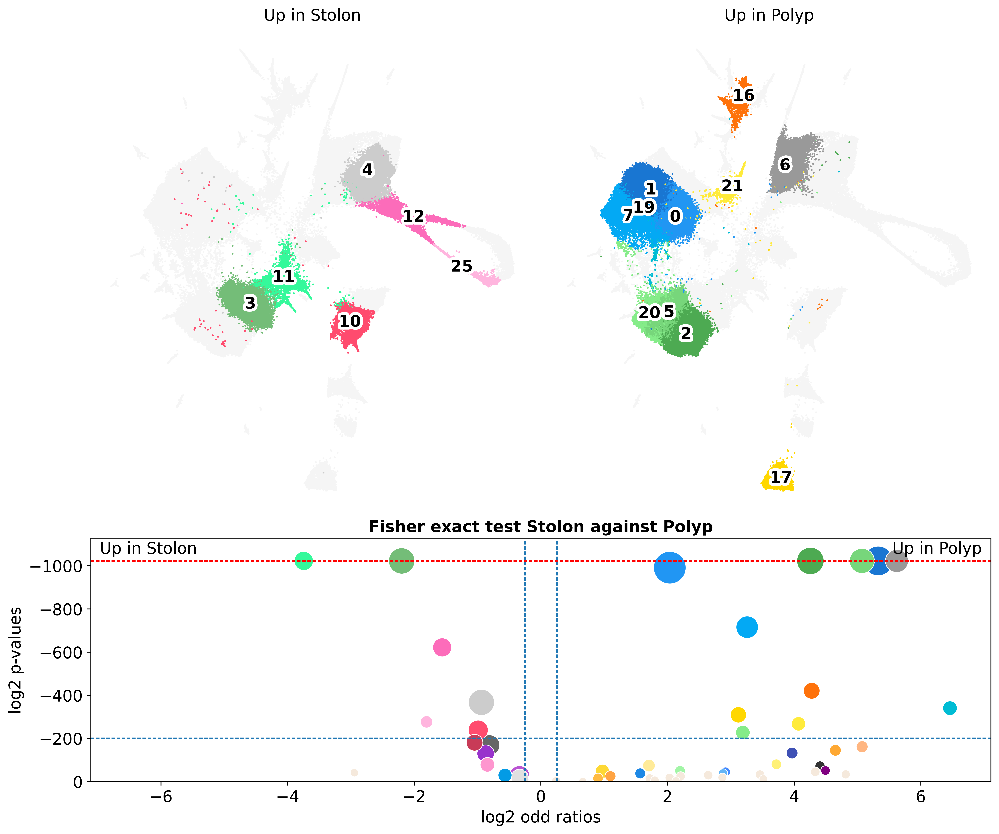

In [ ]:
# Body Polyps vs. Stolons

#definition of control vs test for the purposes of the tests
test = 'Stolon'  # Novel dataset
ctrl = 'Polyp' # Our reference datset

# FIGURE SIZE AND DISTRIBUTION:

    # AAAAEEE etc: Profiles the spatial distribution of plots labeled as A, B, C, D and E.

axd = plt.figure(layout="constrained",figsize = (12, 10)).subplot_mosaic(
    """
    AAAEEE
    AAAEEE
    AAAEEE
    AAAEEE
    CCCCCC
    CCCCCC
    """)

# DEFINITION OF AXES (axd):

max_y = abs(np.log2(fisher_test_body_part['pvals'])).max() * 1.10          # Size limit of the y axis = maximum absolute value in column 'pvals' multiplied by a factor
max_x= abs(np.log2(fisher_test_body_part['odds']).dropna()).max() * 1.10   # Size limit of the x axis = maximum absolute value in column 'odds' multiplied by a factor

# PLOT A: Up in treatment

sc.pl.umap(adata_p, color=clusteringlayer, legend_loc='on data', legend_fontoutline = 5, title= 'Up in '+ test,
    size = 10, groups = up_body_list, na_in_legend=False, na_color='#f5f5f5',frameon=False, show = False,
    ax = axd['A'])



# PLOT C: Volcano plot for up and down regulated clusters

sns.scatterplot(data = np.log2(fisher_test_body_part), x = 'odds', y = 'pvals',   # Defines data (log2) and values in axes.
    size = adata.obs[clusteringlayer].value_counts(),                   # Cluster (dots) sizes are proportionate to their number of counts
    sizes=(50,800),                                                     # Size of the smallest and biggest clusters (dots)
    hue = fisher_test_body_part.index,                                            # Indicates what gets coloured (cluster names)
    palette = list(adata_p.uns[clusteringlayer+'_colors']),               # List of colours to use in the plot
    legend = False,                                                     # No legend in volcano plot
    ax = axd['C'])                                                      # Plot label
axd['C'].axhline(y=-200, xmin=0, xmax=1, dashes = (2,1))        # np.log2(sig) initially
#Traces line in y-axis where y equals the logarithm of p-value (sig)
#blu dashed line is log2(x)=-200 a way more stringent number for significance of enriched clusters
axd['C'].axhline(y=np.log2(2.225074e-308), color='r',xmin=0, xmax=1, dashes = (2,1)) #dashed line representing the p-values so close to zero
axd['C'].axvline(x= ot, ymin=0, ymax=1, dashes = (2,1))
axd['C'].axvline(x=-ot, ymin=0, ymax=1, dashes = (2,1))
axd['C'].invert_yaxis()
axd['C'].set_title('Fisher exact test ' + test + ' against ' + ctrl, weight="bold")
axd['C'].set_xlim(-(max_x), max_x)
axd['C'].set_ylim(0,-(max_y))
axd['C'].set_xlabel('log2 odd ratios')
axd['C'].set_ylabel('log2 p-values')
axd['C'].text(.01, .99, 'Up in '+ test, ha='left', va='top', transform=axd['C'].transAxes)
axd['C'].text(.99, .99, 'Up in '+ ctrl, ha='right', va='top', transform=axd['C'].transAxes)
axd['C'].grid(False)


# PLOT E: Down in control

sc.pl.umap(adata_p, color=clusteringlayer, legend_loc='on data', legend_fontoutline = 5, title= 'Up in '+ ctrl,
        size = 10, groups = down_body_list, na_in_legend=False, na_color='#f5f5f5', frameon=False, show = False,
        ax = axd['E'])

/mnt/sda/david/.local/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/mnt/sda/david/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)
/mnt/sda/david/.local/lib/python3.8/site-packages/pandas/core/internals/blocks.py:402: RuntimeWarning: divide by zero encountered in log2
  result = func(self.values, **kwargs)
/mnt/sda/david/.local/lib/python3.8/site-packages/pandas/core/internals/blocks.py:402: RuntimeWarning: invalid value encountered in log2
  result = func(self.values, **kwargs)
/mnt/sda/david/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a 

<AxesSubplot:label='E', title={'center':'Up in Polyps_Feeding'}, xlabel='UMAP1', ylabel='UMAP2'>

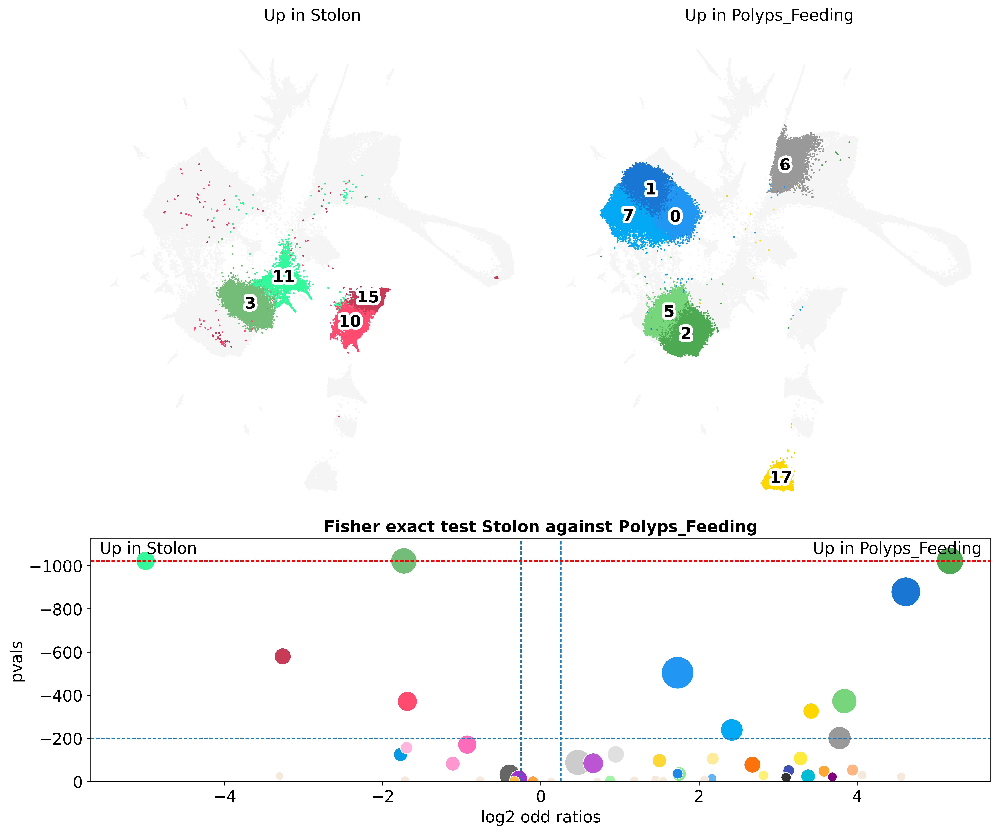

In [ ]:
#Stolons vs. Feeding

#definition of control vs test for the purposes of the tests
test = 'Stolon'  # Novel dataset
ctrl = 'Polyps_Feeding' # Our reference datset

axd = plt.figure(layout="constrained",figsize = (12, 10)).subplot_mosaic(
    """
    AAAEEE
    AAAEEE
    AAAEEE
    AAAEEE
    CCCCCC
    CCCCCC
    """)

# DEFINITION OF AXES (axd):

max_y = abs(np.log2(fisher_test_feeding_stolon['pvals'])).max() * 1.10          # Size limit of the y axis = maximum absolute value in column 'pvals' multiplied by a factor
max_x= abs(np.log2(fisher_test_feeding_stolon['odds']).dropna()).max() * 1.10   # Size limit of the x axis = maximum absolute value in column 'odds' multiplied by a factor

# PLOT A: Up in treatment

sc.pl.umap(adata_p, color=clusteringlayer, legend_loc='on data', legend_fontoutline = 5, title= 'Up in '+ test,
    size = 10, groups = up_feed_stol_list, na_in_legend=False, na_color='#f5f5f5', frameon=False, show = False,
    ax = axd['A'])



# PLOT C: Volcano plot for up and down regulated clusters

sns.scatterplot(data = np.log2(fisher_test_feeding_stolon), x = 'odds', y = 'pvals',   # Defines data (log2) and values in axes.
    size = adata.obs[clusteringlayer].value_counts(),                   # Cluster (dots) sizes are proportionate to their number of counts
    sizes=(50,800),                                                     # Size of the smallest and biggest clusters (dots)
    hue = fisher_test_feeding_stolon.index,                                            # Indicates what gets coloured (cluster names)
    palette = list(adata_p.uns[clusteringlayer+'_colors']),               # List of colours to use in the plot
    legend = False,                                                     # No legend in volcano plot
    ax = axd['C'])                                                      # Plot label
axd['C'].axhline(y=np.log2(sig), xmin=0, xmax=1, dashes = (2,1))        # Traces line in y-axis where y equals the logarithm of p-value (sig)
axd['C'].axhline(y=np.log2(2.225074e-308), color='r',xmin=0, xmax=1, dashes = (2,1)) #dashed line representing the p-values so close to zero
axd['C'].axvline(x= ot, ymin=0, ymax=1, dashes = (2,1))
axd['C'].axvline(x=-ot, ymin=0, ymax=1, dashes = (2,1))
axd['C'].invert_yaxis()
axd['C'].set_title('Fisher exact test ' + test + ' against ' + ctrl, weight="bold")
axd['C'].set_xlim(-(max_x), max_x)
axd['C'].set_ylim(0,-(max_y))
axd['C'].set_xlabel('log2 odd ratios')
axd['C'].text(.01, .99, 'Up in '+ test, ha='left', va='top', transform=axd['C'].transAxes)
axd['C'].text(.99, .99, 'Up in '+ ctrl, ha='right', va='top', transform=axd['C'].transAxes)
axd['C'].grid(False)


# PLOT E: Down in control

sc.pl.umap(adata_p, color=clusteringlayer, legend_loc='on data', legend_fontoutline = 5, title= 'Up in '+ ctrl,
        size = 10, groups = down_feed_stol_list, na_in_legend=False, na_color='#f5f5f5', frameon=False, show = False,
        ax = axd['E'])

/mnt/sda/david/.local/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/mnt/sda/david/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)
/mnt/sda/david/.local/lib/python3.8/site-packages/pandas/core/internals/blocks.py:402: RuntimeWarning: divide by zero encountered in log2
  result = func(self.values, **kwargs)
/mnt/sda/david/.local/lib/python3.8/site-packages/pandas/core/internals/blocks.py:402: RuntimeWarning: invalid value encountered in log2
  result = func(self.values, **kwargs)
/mnt/sda/david/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a 

<AxesSubplot:label='E', title={'center':'Up in Polyps_Sexual'}, xlabel='UMAP1', ylabel='UMAP2'>

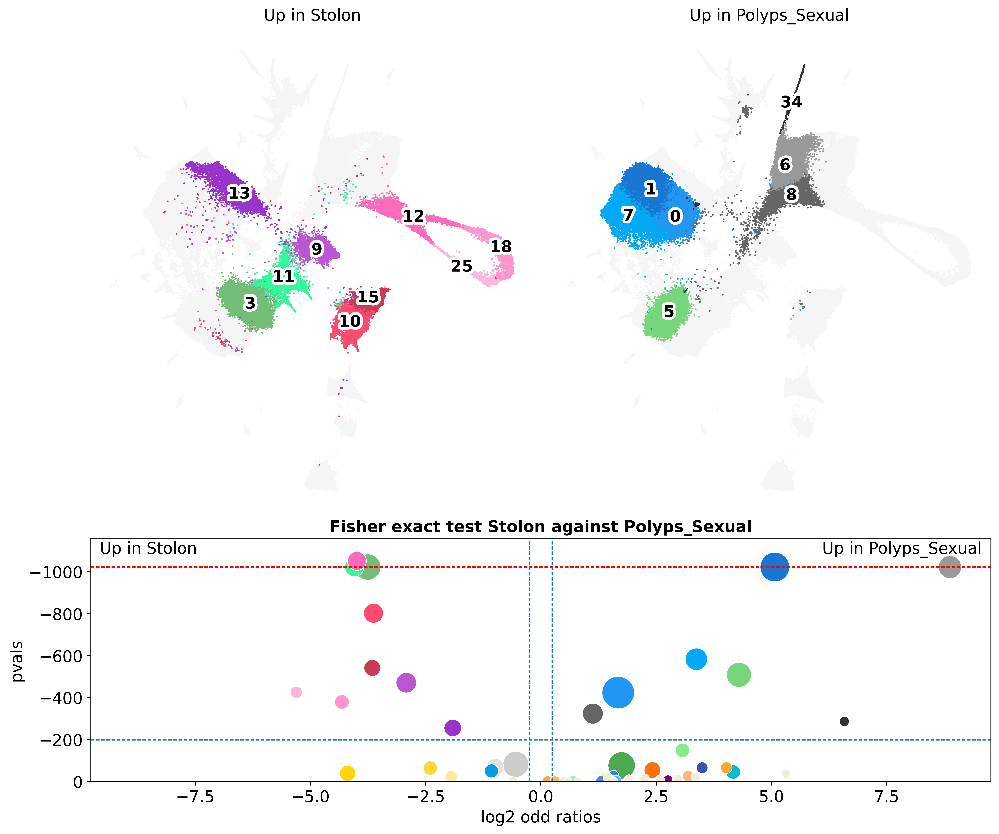

In [ ]:
#Stolons vs. Sexual polyps

#definition of control vs test for the purposes of the tests
test = 'Stolon'  # Novel dataset
ctrl = 'Polyps_Sexual' # Our reference datset

axd = plt.figure(layout="constrained",figsize = (12, 10)).subplot_mosaic(
    """
    AAAEEE
    AAAEEE
    AAAEEE
    AAAEEE
    CCCCCC
    CCCCCC
    """)

# DEFINITION OF AXES (axd):

max_y = abs(np.log2(fisher_test_sexual_stolon['pvals'])).max() * 1.10          # Size limit of the y axis = maximum absolute value in column 'pvals' multiplied by a factor
max_x= abs(np.log2(fisher_test_sexual_stolon['odds']).dropna()).max() * 1.10   # Size limit of the x axis = maximum absolute value in column 'odds' multiplied by a factor

# PLOT A: Up in treatment

sc.pl.umap(adata_p, color=clusteringlayer, legend_loc='on data', legend_fontoutline = 5, title= 'Up in '+ test,
    size = 10, groups = up_sexual_stol_list, na_in_legend=False, na_color='#f5f5f5', frameon=False, show = False,
    ax = axd['A'])



# PLOT C: Volcano plot for up and down regulated clusters

sns.scatterplot(data = np.log2(fisher_test_sexual_stolon), x = 'odds', y = 'pvals',   # Defines data (log2) and values in axes.
    size = adata.obs[clusteringlayer].value_counts(),                   # Cluster (dots) sizes are proportionate to their number of counts
    sizes=(50,800),                                                     # Size of the smallest and biggest clusters (dots)
    hue = fisher_test_sexual_stolon.index,                                            # Indicates what gets coloured (cluster names)
    palette = list(adata_p.uns[clusteringlayer+'_colors']),               # List of colours to use in the plot
    legend = False,                                                     # No legend in volcano plot
    ax = axd['C'])                                                      # Plot label
axd['C'].axhline(y=np.log2(sig), xmin=0, xmax=1, dashes = (2,1))        # Traces line in y-axis where y equals the logarithm of p-value (sig)
axd['C'].axhline(y=np.log2(2.225074e-308), color='r',xmin=0, xmax=1, dashes = (2,1)) #dashed line representing the p-values so close to zero
axd['C'].axvline(x= ot, ymin=0, ymax=1, dashes = (2,1))
axd['C'].axvline(x=-ot, ymin=0, ymax=1, dashes = (2,1))
axd['C'].invert_yaxis()
axd['C'].set_title('Fisher exact test ' + test + ' against ' + ctrl, weight="bold")
axd['C'].set_xlim(-(max_x), max_x)
axd['C'].set_ylim(0,-(max_y))
axd['C'].set_xlabel('log2 odd ratios')
axd['C'].text(.01, .99, 'Up in '+ test, ha='left', va='top', transform=axd['C'].transAxes)
axd['C'].text(.99, .99, 'Up in '+ ctrl, ha='right', va='top', transform=axd['C'].transAxes)
axd['C'].grid(False)


# PLOT E: Down in control

sc.pl.umap(adata_p, color=clusteringlayer, legend_loc='on data', legend_fontoutline = 5, title= 'Up in '+ ctrl,
        size = 10, groups = down_sexual_stol_list, na_in_legend=False, na_color='#f5f5f5', frameon=False, show = False,
        ax = axd['E'])

/mnt/sda/david/.local/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/mnt/sda/david/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)
/mnt/sda/david/.local/lib/python3.8/site-packages/pandas/core/internals/blocks.py:402: RuntimeWarning: divide by zero encountered in log2
  result = func(self.values, **kwargs)
/mnt/sda/david/.local/lib/python3.8/site-packages/pandas/core/internals/blocks.py:402: RuntimeWarning: invalid value encountered in log2
  result = func(self.values, **kwargs)
/mnt/sda/david/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a 

<AxesSubplot:label='E', title={'center':'Up in Polyps_Sexual'}, xlabel='UMAP1', ylabel='UMAP2'>

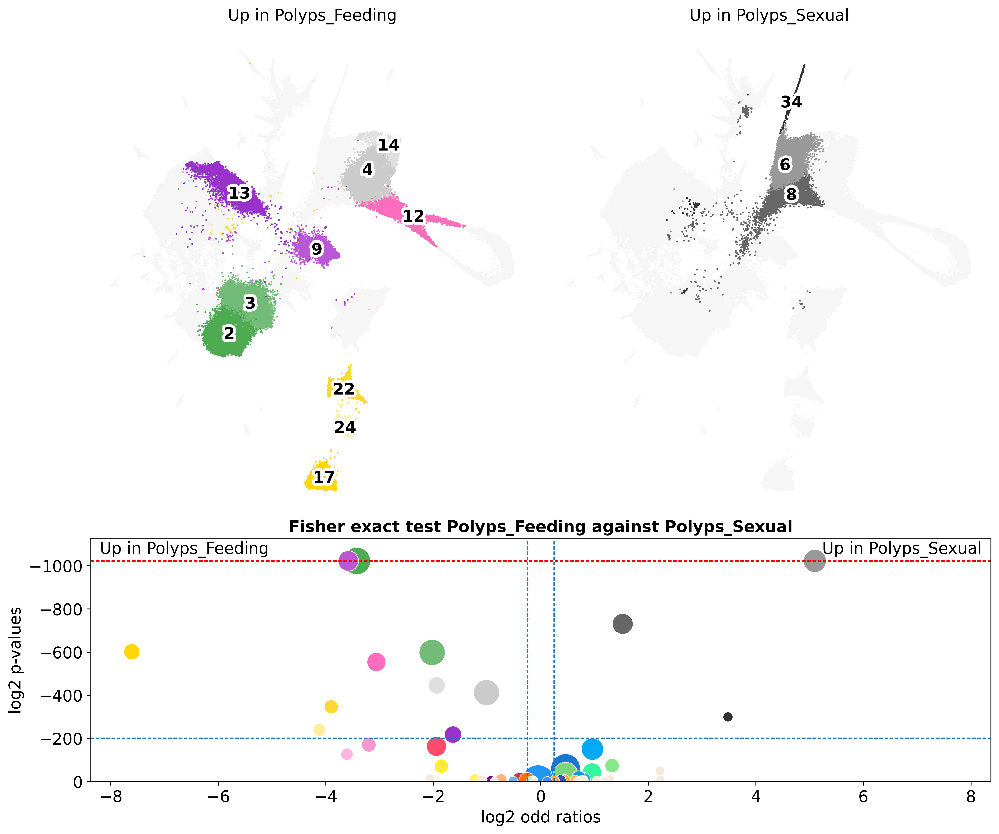

In [ ]:
#definition of control vs test for the purposes of the tests
test = 'Polyps_Feeding'  # Novel dataset
ctrl = 'Polyps_Sexual' # Our reference datset

axd = plt.figure(layout="constrained",figsize = (12, 10)).subplot_mosaic(
    """
    AAAEEE
    AAAEEE
    AAAEEE
    AAAEEE
    CCCCCC
    CCCCCC
    """)

# DEFINITION OF AXES (axd):

max_y = abs(np.log2(fisher_test_sexual_feeding['pvals'])).max() * 1.10          # Size limit of the y axis = maximum absolute value in column 'pvals' multiplied by a factor
max_x= abs(np.log2(fisher_test_sexual_feeding['odds']).dropna()).max() * 1.10   # Size limit of the x axis = maximum absolute value in column 'odds' multiplied by a factor

# PLOT A: Up in treatment

sc.pl.umap(adata_p, color=clusteringlayer, legend_loc='on data', legend_fontoutline = 5, title= 'Up in '+ test,
    size = 10, groups = up_sexual_feed_list, na_in_legend=False, na_color='#f5f5f5', frameon=False, show = False,
    ax = axd['A'])



# PLOT C: Volcano plot for up and down regulated clusters

sns.scatterplot(data = np.log2(fisher_test_sexual_feeding), x = 'odds', y = 'pvals',   # Defines data (log2) and values in axes.
    size = adata.obs[clusteringlayer].value_counts(),                   # Cluster (dots) sizes are proportionate to their number of counts
    sizes=(50,800),                                                     # Size of the smallest and biggest clusters (dots)
    hue = fisher_test_sexual_feeding.index,                                            # Indicates what gets coloured (cluster names)
    palette = list(adata_p.uns[clusteringlayer+'_colors']),               # List of colours to use in the plot
    legend = False,                                                     # No legend in volcano plot
    ax = axd['C'])                                                      # Plot label
axd['C'].axhline(y=-200, xmin=0, xmax=1, dashes = (2,1))        # np.log2(sig) initially
#Traces line in y-axis where y equals the logarithm of p-value (sig)
#blu dashed line is log2(x)=-200 a way more stringent number for significance of enriched clusters
axd['C'].axhline(y=np.log2(2.225074e-308), color='r',xmin=0, xmax=1, dashes = (2,1)) #dashed line representing the p-values so close to zero
axd['C'].axvline(x= ot, ymin=0, ymax=1, dashes = (2,1))
axd['C'].axvline(x=-ot, ymin=0, ymax=1, dashes = (2,1))
axd['C'].invert_yaxis()
axd['C'].set_title('Fisher exact test ' + test + ' against ' + ctrl, weight="bold")
axd['C'].set_xlim(-(max_x), max_x)
axd['C'].set_ylim(0,-(max_y))
axd['C'].set_xlabel('log2 odd ratios')
axd['C'].set_ylabel('log2 p-values')
axd['C'].text(.01, .99, 'Up in '+ test, ha='left', va='top', transform=axd['C'].transAxes)
axd['C'].text(.99, .99, 'Up in '+ ctrl, ha='right', va='top', transform=axd['C'].transAxes)
axd['C'].grid(False)


# PLOT E: Down in control

sc.pl.umap(adata_p, color=clusteringlayer, legend_loc='on data', legend_fontoutline = 5, title= 'Up in '+ ctrl,
        size = 10, groups = down_sexual_feed_list, na_in_legend=False, na_color='#f5f5f5', frameon=False, show = False,
        ax = axd['E'])